In [2]:
import pathlib

import matplotlib.pyplot as plt
import numpy as np
import pandas as pd
import seaborn as sns

In [3]:
dataset_path = '/home/amanda/Dropbox/trabalho/testes/aplicacoes/california_housing/housing.csv'
raw_dataset = pd.read_csv(dataset_path)
dataset = raw_dataset.copy()
dataset.tail()

,longitude,latitude,housing_median_age,total_rooms,total_bedrooms,population,households,median_income,median_house_value,ocean_proximity
20635,-121.09,39.48,25.0,1665.0,374.0,845.0,330.0,1.5603,78100.0,INLAND
20636,-121.21,39.49,18.0,697.0,150.0,356.0,114.0,2.5568,77100.0,INLAND
20637,-121.22,39.43,17.0,2254.0,485.0,1007.0,433.0,1.7000,92300.0,INLAND
20638,-121.32,39.43,18.0,1860.0,409.0,741.0,349.0,1.8672,84700.0,INLAND
20639,-121.24,39.37,16.0,2785.0,616.0,1387.0,530.0,2.3886,89400.0,INLAND


In [4]:
len(dataset)

20640

In [5]:
dataset.pop('ocean_proximity')

0        NEAR BAY
1        NEAR BAY
2        NEAR BAY
3        NEAR BAY
4        NEAR BAY
           ...   
20635      INLAND
20636      INLAND
20637      INLAND
20638      INLAND
20639      INLAND
Name: ocean_proximity, Length: 20640, dtype: object

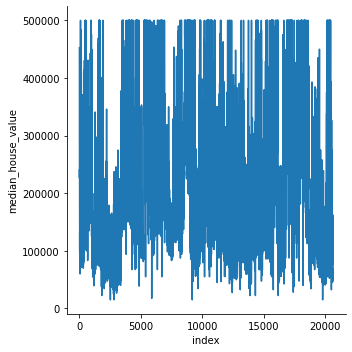

In [6]:
sns.relplot(x='index', y='median_house_value', kind='line', data=dataset.reset_index())

In [7]:
dataset.tail()

,longitude,latitude,housing_median_age,total_rooms,total_bedrooms,population,households,median_income,median_house_value
20635,-121.09,39.48,25.0,1665.0,374.0,845.0,330.0,1.5603,78100.0
20636,-121.21,39.49,18.0,697.0,150.0,356.0,114.0,2.5568,77100.0
20637,-121.22,39.43,17.0,2254.0,485.0,1007.0,433.0,1.7000,92300.0
20638,-121.32,39.43,18.0,1860.0,409.0,741.0,349.0,1.8672,84700.0
20639,-121.24,39.37,16.0,2785.0,616.0,1387.0,530.0,2.3886,89400.0


In [11]:
dataset.isna().sum()

longitude               0
latitude                0
housing_median_age      0
total_rooms             0
total_bedrooms        207
population              0
households              0
median_income           0
median_house_value      0
dtype: int64

In [7]:
train_dataset = dataset.sample(n=10320,random_state=10)
test_dataset = dataset.drop(train_dataset.index)

In [8]:
len(train_dataset)

10320

In [9]:
len(test_dataset)

10320

In [10]:
train_dataset.head()

,longitude,latitude,housing_median_age,total_rooms,total_bedrooms,population,households,median_income,median_house_value
20303,-119.18,34.16,12.0,460.0,101.0,405.0,103.0,5.2783,167400.0
16966,-122.31,37.55,27.0,3931.0,933.0,1877.0,851.0,3.9722,354100.0
10623,-117.77,33.67,12.0,4329.0,1068.0,1913.0,978.0,4.5094,160200.0
6146,-117.95,34.11,29.0,1986.0,448.0,2013.0,432.0,3.1034,140800.0
2208,-119.87,36.81,6.0,1891.0,341.0,969.0,330.0,4.6726,107800.0


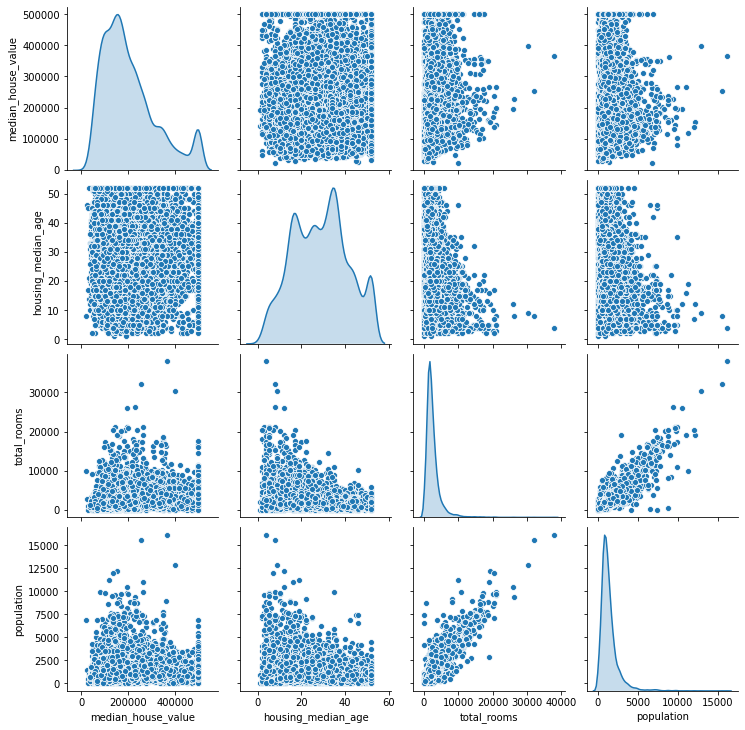

In [11]:
sns.pairplot(train_dataset[["median_house_value", "housing_median_age", "total_rooms", "population"]], diag_kind="kde")

In [12]:
train_stats = train_dataset.describe()
train_stats = train_stats.transpose()
train_stats

,count,mean,std,min,25%,50%,75%,max
longitude,10320.0,-119.565679,1.993352,-124.3000,-121.78000,-118.48000,-118.0175,-114.3100
latitude,10320.0,35.628038,2.132678,32.5600,33.94000,34.25000,37.7200,41.9500
housing_median_age,10320.0,28.774806,12.476234,1.0000,18.00000,29.00000,37.0000,52.0000
total_rooms,10320.0,2621.660078,2160.705644,2.0000,1441.00000,2112.00000,3124.0000,37937.0000
total_bedrooms,10222.0,534.588632,418.342780,2.0000,295.00000,433.00000,640.7500,5471.0000
population,10320.0,1414.737984,1092.582408,3.0000,785.00000,1159.00000,1703.0000,16122.0000
households,10320.0,496.013469,380.268418,2.0000,279.00000,407.00000,597.0000,5189.0000
median_income,10320.0,3.887074,1.910092,0.4999,2.56075,3.54885,4.7815,15.0001
median_house_value,10320.0,206949.114922,114988.821037,22500.0000,120000.00000,179450.00000,265500.0000,500001.0000


In [13]:
def scale(x):
  return (x - train_stats['min']) / (train_stats['max'] - train_stats['min'])
scaled_train_data = scale(train_dataset)
scaled_test_data = scale(test_dataset)

In [14]:
scaled_train_data.tail()

,longitude,latitude,housing_median_age,total_rooms,total_bedrooms,population,households,median_income,median_house_value
13018,0.310310,0.652822,0.490196,0.081060,0.110624,0.099262,0.114324,0.152929,0.240837
14371,0.706707,0.015974,0.607843,0.109714,0.127811,0.079037,0.116638,0.425249,1.000000
16814,0.187187,0.541001,0.647059,0.221379,0.330956,0.254234,0.330634,0.248507,0.583245
17091,0.207207,0.523962,0.627451,0.081877,0.146828,0.117377,0.137845,0.193211,0.513507
4963,0.602603,0.154420,0.647059,0.060709,0.141342,0.151808,0.142279,0.083751,0.229319


In [17]:
train_labels = scaled_train_data.pop('median_house_value')
test_labels = scaled_test_data.pop('median_house_value')

In [19]:
import os

def save(path):
    if not os.path.exists(path):
        os.makedirs(path)

    np.savetxt(path + 'X_train.csv', scaled_train_data)
    np.savetxt(path + 'X_test.csv', scaled_test_data)
    np.savetxt(path + 'Y_train.csv', train_labels)
    np.savetxt(path + 'Y_test.csv', test_labels)    

path = '/home/amanda/Dropbox/trabalho/testes/aplicacoes/california_housing/data/'
save(path)

path = '/home/amanda/Dropbox/trabalho/codigos/propostas/EVeP/data/california_housing/'
save(path)

FileNotFoundError: [Errno 2] No such file or directory: '/home/amanda/Dropbox/trabalho/codigos/propostas/EVeP/data/california_housing/X_train.csv'